In [43]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import pandas as pd
import pandas_profiling as pdp
import numpy as np

import lightgbm as lgb

#回帰の可視化
#関数の処理で必要なライブラリ
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer

from sklearn.ensemble import (
    ExtraTreesRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor,
)

import shap
# import xgboost

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)


import warnings
warnings.filterwarnings('ignore')

# 関数

In [44]:
import gather_function

In [45]:
import importlib
importlib.reload(gather_function)

<module 'gather_function' from '/Users/ryosuke/Desktop/副業/AI Quest/assessment/gather_function.py'>

In [46]:
original_train_data = pd.read_csv('train.csv')
original_test_data = pd.read_csv('test.csv')

In [47]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

del train['id']
del test['id']

print('len(train)=', len(train))
print('len(test)', len(test))
print(len(test)/len(train))

len(train)= 55583
len(test) 18528
0.3333393303707968


# 説明変数

|カラム|ヘッダ名称|データ型|説明|
|-|-|-|-|
|0|	id|	int| インデックスとして使用|
|1|	accommodates|	int|	収容可能人数|
|2|	amenities|	char|	アメニティ|
|3|	bathrooms|	float|	風呂数|
|4|	bed_type|	char|	ベッドの種類|
|5|	bedrooms|	float|	ベッドルーム数|
|6|	beds|	float|	ベッド数|
|7|	cancellation_policy|	char|	キャンセルポリシー|
|8|	city|	char|	都市|
|9|	cleaning_fee|	int|	クリーニング料金を含むか|
|10|	description|	char|	説明|
|11|	first_review|	char|	最初のレビュー日|
|12|	host_has_profile_pic|	int|	ホストの写真があるかどうか|
|13|	host_identity_verified|	int|	ホストの身元確認が取れているか|
|14|	host_response_rate|	char|	ホストの返信率|
|15|	host_since|	char|	ホストの登録日|
|16|	instant_bookable|	char|	即時予約可能か|
|17|	last_review	|char|	最後のレビュー日|
|18|	latitude|	float|	緯度|
|19|longitude|	float|	経度|
|20|	name|	char|	物件名|
|21|	neighbourhood|	char|	近隣情報|
|22|	number_of_reviews|	int|	レビュー数|
|23|	property_type|	char|	物件の種類|
|24|	review_scores_rating|	float|	レビュースコア|
|25|	room_type|	char|	部屋の種類|
|26|	thumbnail_url|	char|	サムネイル画像リンク|
|27|	zipcode|	int|	郵便番号|
|28|    y| float|	宿泊価格|

# トレーニングデータの処理

In [48]:
#学習データを目的変数とそれ以外に分ける
train_X = train.drop('y', axis=1)
train_y = train['y']

test_X = test.copy()

#学習データとテストデータを統合
all_data_X = pd.concat([train_X,test_X],axis=0,sort=True)

In [49]:
#それぞれのデータのサイズを確認
print("train_X: "+str(train_X.shape))
print("train_y: "+str(train_y.shape))
print("test_X: "+str(test_X.shape))
print("all_data_X: "+str(all_data_X.shape))

train_X: (55583, 27)
train_y: (55583,)
test_X: (18528, 27)
all_data_X: (74111, 27)


In [50]:
all_data_X.head()

,accommodates,amenities,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,cleaning_fee,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,property_type,review_scores_rating,room_type,thumbnail_url,zipcode
0,6,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",2.0,Real Bed,1.0,4.0,flexible,LA,t,My place is meant for family and a few friends...,2016-07-27,t,f,NaN,2016-07-13,f,2016-07-27,33.788931,-118.154761,The Penthouse,NaN,1,Apartment,60.0,Private room,NaN,90804
1,2,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,1.0,strict,DC,t,This is a new listing for a lovely guest bedro...,2016-09-12,t,t,100%,2015-12-30,f,2017-03-31,38.934810,-76.978190,Guest Bedroom in Brookland,Brookland,9,House,100.0,Private room,https://a0.muscache.com/im/pictures/e4d8b51f-6...,20018
2,2,"{TV,Internet,""Wireless Internet"",Kitchen,""Indo...",2.0,Real Bed,1.0,1.0,strict,NYC,t,We're looking forward to your stay at our apt....,2016-06-15,t,f,100%,2016-05-21,t,2017-08-13,40.695118,-73.926240,Clean Modern Room in Lux Apt 1 Block From J Train,Bushwick,27,Apartment,83.0,Private room,https://a0.muscache.com/im/pictures/5ffecc9b-d...,NaN
3,2,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1.0,Real Bed,1.0,1.0,strict,SF,t,BEST CITY VIEWS - - ROOF DECK W/ BBQ & WiFi - ...,2014-03-15,t,t,100%,2012-06-19,t,2017-09-03,37.796728,-122.411906,BEST views + reviews! 5/5 stars*****,Nob Hill,38,Apartment,95.0,Private room,NaN,94133
4,2,"{TV,Internet,""Wireless Internet"",""Air conditio...",1.0,Real Bed,1.0,1.0,strict,NYC,t,Charming Apartment on the upper west side of M...,2015-08-05,t,t,100%,2015-03-25,f,2017-09-10,40.785050,-73.974691,Charming 1-bedroom - UWS Manhattan,Upper West Side,5,Apartment,100.0,Entire home/apt,https://a0.muscache.com/im/pictures/92879730/5...,10024


## 説明変数の前処理

### EDA結果の追加

In [51]:
all_data_X_addEDA, max_amenities_list = gather_function.preprocessing(all_data_X)


100%|███████████████████████████████████████████| 86/86 [00:03<00:00, 23.15it/s]


In [52]:
all_data_X_addEDA[all_data_X_addEDA.columns[:99]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74111 entries, 0 to 18527
Data columns (total 99 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   accommodates                       74111 non-null  int64  
 1   bathrooms                          74111 non-null  int64  
 2   bed_type                           74111 non-null  object 
 3   bedrooms                           74111 non-null  int64  
 4   beds                               74111 non-null  int64  
 5   cancellation_policy                74111 non-null  object 
 6   city                               74111 non-null  object 
 7   cleaning_fee                       74111 non-null  object 
 8   host_has_profile_pic               74111 non-null  object 
 9   host_identity_verified             74111 non-null  object 
 10  host_response_rate                 74111 non-null  int64  
 11  instant_bookable                   74111 non-null  obj

## 対数変換した説明変数を追加

['beds_par_1', 'bathrooms_par_1', 'bathrooms', 'review_score_total', 'number_of_reviews', 'beds', 'accommodates', 'bedrooms', 'bedrooms_par_1', 'rare_amenities_count', 'amenities_count', 'latitude', 'latitude_longitude', 'host_response_rate_weight', 'review_score_weight', 'description_word_count', 'host_response_rate']


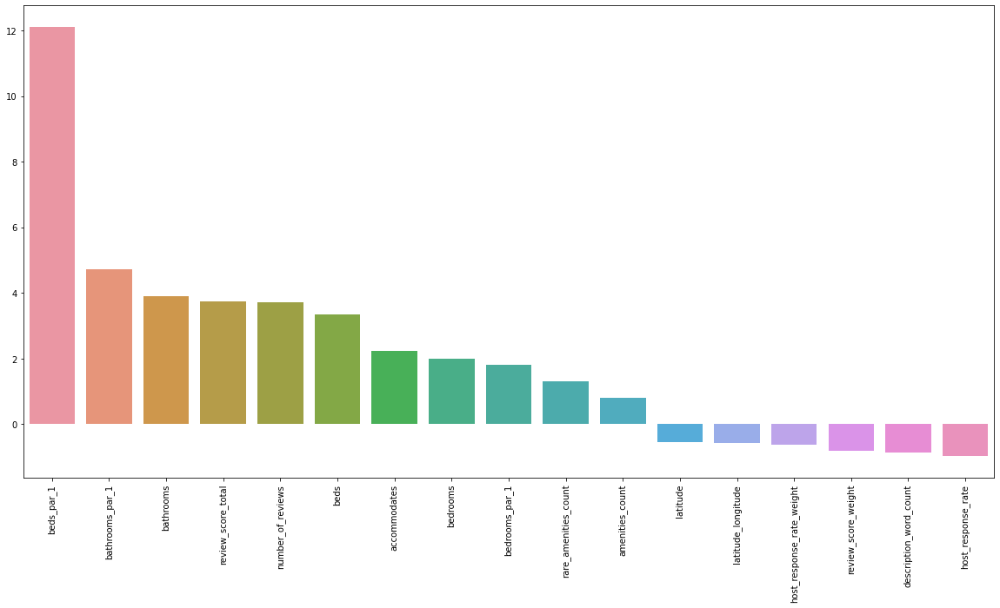

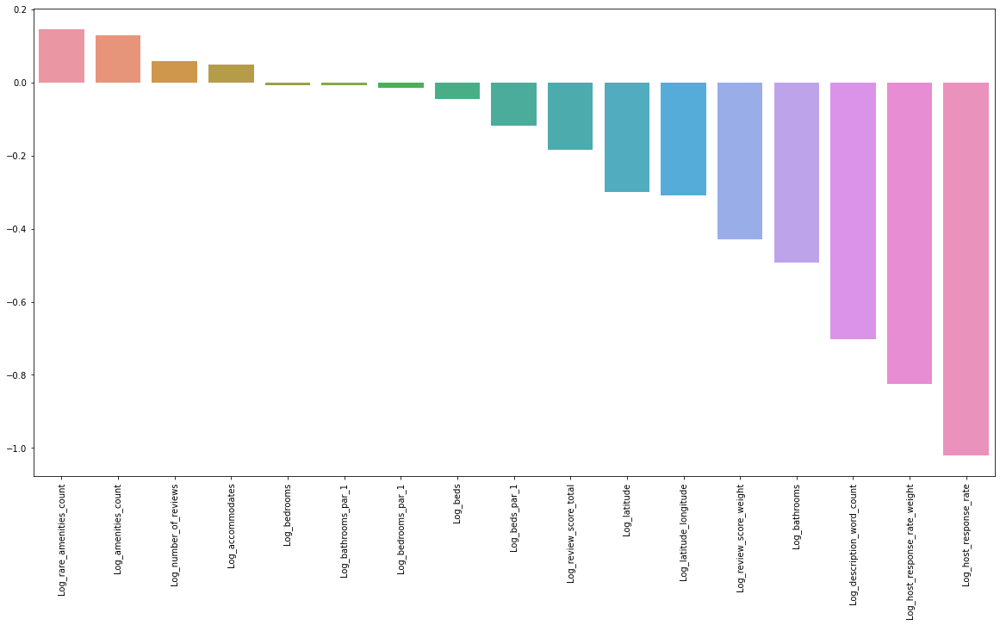

In [53]:
all_data_X_addEDA_log, num_col_feat_list, pt = gather_function.logarithmic_transformation(all_data_X_addEDA)

## カテゴリー変数化

In [54]:
#one-hot変換をせずにlabelencodingする → カテゴリ変数化
categorical_columns = ['neighbourhood']

In [55]:
all_data_X_addEDA_log_dummy = gather_function.process_categorical(all_data_X_addEDA_log, categorical_columns)

100%|████████████████████████████████████████████| 1/1 [00:00<00:00, 746.72it/s]


In [56]:
all_data_X_addEDA_log_dummy[all_data_X_addEDA_log_dummy.columns[:99]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74111 entries, 0 to 18527
Data columns (total 99 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   accommodates                         74111 non-null  int64   
 1   bathrooms                            74111 non-null  int64   
 2   bedrooms                             74111 non-null  int64   
 3   beds                                 74111 non-null  int64   
 4   host_response_rate                   74111 non-null  int64   
 5   latitude                             74111 non-null  float64 
 6   longitude                            74111 non-null  float64 
 7   neighbourhood                        74111 non-null  category
 8   number_of_reviews                    74111 non-null  int64   
 9   review_scores_rating                 57389 non-null  float64 
 10  thumbnail_url                        65895 non-null  float64 
 11  bathrooms_par_1

# 目的変数の処理

In [57]:
train_y_ac = train_y / all_data_X_addEDA_log_dummy["accommodates"]
#目的変数の対数log(x+1)をとる
train_y_ac_log = np.log1p(train_y_ac) #②
train_y_log = np.log1p(train_y) #③

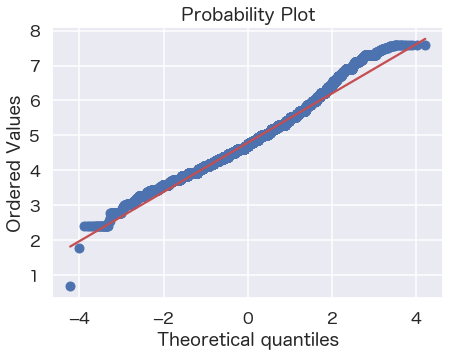

In [58]:
import scipy.stats as stats
 
sns.set(font="Hiragino Maru Gothic Pro",context="talk")
fig = plt.subplots(figsize=(7,5))
 
stats.probplot(train_y_log, dist="norm", plot=plt)
plt.show()

train_y
歪度: 4.264338
尖度: 26.030945
np.exp(train_y_log)
歪度: 4.264338
尖度: 26.030945


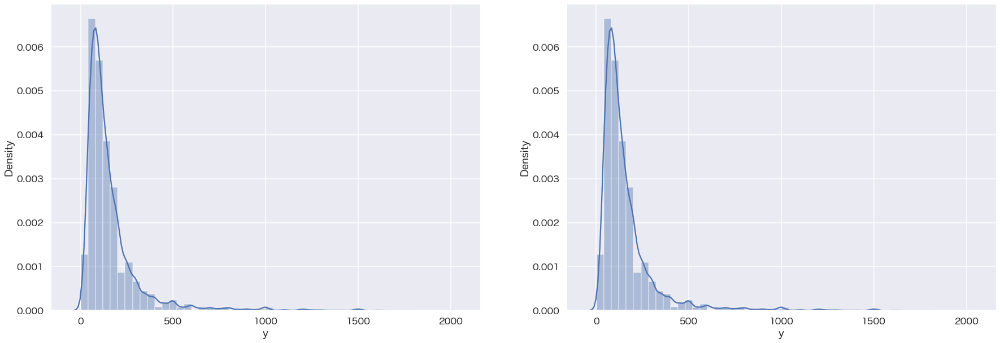

In [59]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[30, 10])

sns.distplot(train_y, ax=ax1)
#歪度と尖度を計算
print('train_y')
print("歪度: %f" % train_y.skew())
print("尖度: %f" % train_y.kurt())

print('=============')

sns.distplot(np.exp(train_y_log), ax=ax2)
print('np.exp(train_y_log)')
#歪度と尖度を計算
print("歪度: %f" % np.exp(train_y_log).skew())
print("尖度: %f" % np.exp(train_y_log).kurt())

# データセットを分ける

In [60]:
#学習データとテストデータに再分割
train_X_addEDA_log_dummy = all_data_X_addEDA_log_dummy.iloc[:train_X.shape[0],:].reset_index(drop=True)

#submit用
test_X_addEDA_log_dummy = all_data_X_addEDA_log_dummy.iloc[train_X.shape[0]:,:].reset_index(drop=True)

#サイズを確認
print("train_X_addEDA_log_dummy: "+str(train_X_addEDA_log_dummy.shape))
print("test_X_addEDA_log_dummy: "+str(test_X_addEDA_log_dummy.shape))

train_X_addEDA_log_dummy: (55583, 194)
test_X_addEDA_log_dummy: (18528, 194)


# Submit用のモデル作成

## パラメータチューニング

In [61]:
pre_dataset_X = train_X_addEDA_log_dummy
pre_dataset_y = train_y_log

In [62]:
import optuna.integration.lightgbm as op_lgb

# LightGBM用のデータセットに変換
op_trainval = lgb.Dataset(pre_dataset_X, pre_dataset_y)

n_splits = 8

In [63]:
# ハイパーパラメータサーチ&モデル構築
op_params = {'objective': 'regression',
          'metric': 'rmse',
          'random_seed':0} 
# クロスバリデーションによるハイパーパラメータの探索 3fold
tuner = op_lgb.LightGBMTunerCV(op_params, op_trainval, verbose_eval=100, early_stopping_rounds=100, folds=KFold(n_splits=n_splits))

# ハイパーパラメータ探索の実行
tuner.run()

[I 2021-08-09 04:07:07,717] A new study created in memory with name: no-name-a8f0edb9-f757-43ac-b2d1-0a0500835b7b
feature_fraction, val_score: inf:   0%|                   | 0/7 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 0.374628:  14%|8     | 1/7 [00:26<02:37, 26.32s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 0.372736:  29%|#7    | 2/7 [00:52<02:10, 26.03s/it]

[800]	cv_agg's rmse: 0.372875 + 0.00414481
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007887 seconds.
You can set `force_row_wise=true` to remove the overhead

feature_fraction, val_score: 0.368271:  43%|##5   | 3/7 [01:33<02:11, 32.88s/it]

[1000]	cv_agg's rmse: 0.36832 + 0.00397117
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008966 seconds.
You can set `force_row_wise=true` to remove the overhead

feature_fraction, val_score: 0.368271:  57%|###4  | 4/7 [01:55<01:26, 28.84s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 0.368271:  71%|####2 | 5/7 [02:20<00:54, 27.46s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction, val_score: 0.368271:  86%|#####1| 6/7 [03:02<00:32, 32.20s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008485 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:   0%|                   | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016892 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012302 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:   5%|5          | 1/20 [01:03<20:14, 63.90s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  10%|#1         | 2/20 [01:50<16:01, 53.44s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  15%|#6         | 3/20 [02:32<13:41, 48.33s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  20%|##2        | 4/20 [03:11<11:54, 44.66s/it]

[1000]	cv_agg's rmse: 0.36832 + 0.00397117
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008927 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010485 seconds.
You can set `force_row_wise=true` to remove the overhead

num_leaves, val_score: 0.368271:  25%|##7        | 5/20 [03:55<11:10, 44.67s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  30%|###3       | 6/20 [04:21<08:54, 38.16s/it]

[1000]	cv_agg's rmse: 0.382845 + 0.00357815
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009123 seconds.
You can set `force_row_wise=true` to remove the overhea

num_leaves, val_score: 0.368271:  35%|###8       | 7/20 [04:45<07:15, 33.52s/it]

[1000]	cv_agg's rmse: 0.397642 + 0.00384668
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009570 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009678 seconds.
You can set `force_row_wise=true` to remove the overhea

num_leaves, val_score: 0.368271:  40%|####4      | 8/20 [05:27<07:14, 36.23s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  45%|####9      | 9/20 [06:01<06:31, 35.61s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  50%|#####     | 10/20 [06:42<06:12, 37.21s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  55%|#####5    | 11/20 [07:22<05:42, 38.08s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008472 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  60%|######    | 12/20 [08:08<05:23, 40.43s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  65%|######5   | 13/20 [08:46<04:37, 39.61s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  70%|#######   | 14/20 [09:23<03:53, 38.87s/it]

[1000]	cv_agg's rmse: 0.368452 + 0.00415342
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009624 seconds.
You can set `force_row_wise=true` to remove the overhea

num_leaves, val_score: 0.368271:  75%|#######5  | 15/20 [10:09<03:25, 41.11s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  80%|########  | 16/20 [10:46<02:39, 39.89s/it]

[1000]	cv_agg's rmse: 0.368452 + 0.00415342
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010633 seconds.
You can set `force_row_wise=true` to remove the overhea

num_leaves, val_score: 0.368271:  85%|########5 | 17/20 [11:19<01:53, 37.70s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  90%|######### | 18/20 [11:57<01:15, 37.79s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

num_leaves, val_score: 0.368271:  95%|#########5| 19/20 [12:23<00:34, 34.40s/it]

[1000]	cv_agg's rmse: 0.377669 + 0.00338231
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008948 seconds.
You can set `force_row_wise=true` to remove the overhea

bagging, val_score: 0.368271:   0%|                      | 0/10 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  10%|#4            | 1/10 [00:27<04:05, 27.32s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  20%|##8           | 2/10 [00:47<03:04, 23.06s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009364 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  30%|####2         | 3/10 [01:04<02:23, 20.49s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013184 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  40%|#####6        | 4/10 [01:44<02:48, 28.01s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008394 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  50%|#######       | 5/10 [02:24<02:41, 32.38s/it]

[1000]	cv_agg's rmse: 0.36864 + 0.00400116
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012416 seconds.
You can set `force_row_wise=true` to remove the overhead

bagging, val_score: 0.368271:  60%|########4     | 6/10 [02:53<02:05, 31.33s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  70%|#########7    | 7/10 [03:28<01:37, 32.45s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012780 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  80%|###########2  | 8/10 [03:54<01:01, 30.53s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271:  90%|############6 | 9/10 [04:25<00:30, 30.50s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

bagging, val_score: 0.368271: 100%|#############| 10/10 [05:07<00:00, 30.73s/it]


[1000]	cv_agg's rmse: 0.369192 + 0.00444679


feature_fraction_stage2, val_score: 0.368271:   0%|       | 0/3 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 0.368271:  33%|3| 1/3 [00:37<01:15, 37.77s/i[I 2021-08-09 04:29:26,444] Trial 37 finished with value: 0.3688940880376961 and parameters: {'feature_fraction': 0.44800000000000006}. Best is trial 37 with value: 0.3688940880376961.
feature_fraction_stage2, val_score: 0.368271:  33%|3| 1/3 [00:37<01:15, 37.77s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 0.368271:  67%|6| 2/3 [01:09<00:34, 34.32s/i[I 2021-08-09 04:29:58,348] Trial 38 finished with value: 0.3686877612176953 and parameters: {'feature_fraction': 0.41600000000000004}. Best is trial 38 with value: 0.3686877612176953.
feature_fraction_stage2, val_score: 0.368271:  67%|6| 2/3 [01:09<00:34, 34.32s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009280 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

feature_fraction_stage2, val_score: 0.368271: 100%|#| 3/3 [01:42<00:00, 33.66s/i[I 2021-08-09 04:30:31,215] Trial 39 finished with value: 0.3691728320433795 and parameters: {'feature_fraction': 0.48000000000000004}. Best is trial 38 with value: 0.3686877612176953.
feature_fraction_stage2, val_score: 0.368271: 100%|#| 3/3 [01:42<00:00, 34.18s/i
regularization_factors, val_score: 0.368271:   0%|       | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.368271:   5%| | 1/20 [00:30<09:39, 30.48s/i[I 2021-08-09 04:31:01,699] Trial 40 finished with value: 0.36844992736611826 and parameters: {'lambda_l1': 0.003743525109740605, 'lambda_l2': 0.01654879158018369}. Best is trial 40 with value: 0.36844992736611826.
regularization_factors, val_score: 0.368271:   5%| | 1/20 [00:30<09:39, 30.48s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009251 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.368271:  10%|1| 2/20 [01:05<10:00, 33.34s/i[I 2021-08-09 04:31:37,047] Trial 41 finished with value: 0.36869554701567925 and parameters: {'lambda_l1': 1.9009940145152175e-06, 'lambda_l2': 0.5310773636279057}. Best is trial 40 with value: 0.36844992736611826.
regularization_factors, val_score: 0.368271:  10%|1| 2/20 [01:05<10:00, 33.34s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009249 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.368271:  15%|1| 3/20 [01:45<10:12, 36.05s/i[I 2021-08-09 04:32:16,325] Trial 42 finished with value: 0.3687361560033215 and parameters: {'lambda_l1': 3.0228773468292076e-06, 'lambda_l2': 1.1000902376637046e-06}. Best is trial 40 with value: 0.36844992736611826.
regularization_factors, val_score: 0.368271:  15%|1| 3/20 [01:45<10:12, 36.05s/i

[1000]	cv_agg's rmse: 0.368818 + 0.0041533
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009286 seconds.
You can set `force_row_wise=true` to remove the overhead

regularization_factors, val_score: 0.368271:  20%|2| 4/20 [02:21<09:41, 36.35s/i[I 2021-08-09 04:32:53,118] Trial 43 finished with value: 0.36837698237101835 and parameters: {'lambda_l1': 0.003022681786130863, 'lambda_l2': 0.00015014370431732117}. Best is trial 43 with value: 0.36837698237101835.
regularization_factors, val_score: 0.368271:  20%|2| 4/20 [02:21<09:41, 36.35s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009495 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  25%|2| 5/20 [02:58<09:08, 36.54s/i[I 2021-08-09 04:33:29,997] Trial 44 finished with value: 0.3679449155594197 and parameters: {'lambda_l1': 0.5449159747753963, 'lambda_l2': 8.915129342012305e-05}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  25%|2| 5/20 [02:58<09:08, 36.54s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  30%|3| 6/20 [03:38<08:44, 37.46s/i[I 2021-08-09 04:34:09,240] Trial 45 finished with value: 0.3686036318155441 and parameters: {'lambda_l1': 2.9152539990197812e-08, 'lambda_l2': 1.7576573856645224e-06}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  30%|3| 6/20 [03:38<08:44, 37.46s/i

[1000]	cv_agg's rmse: 0.368623 + 0.0039532
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009238 seconds.
You can set `force_row_wise=true` to remove the overhead

regularization_factors, val_score: 0.367945:  35%|3| 7/20 [04:16<08:11, 37.80s/i[I 2021-08-09 04:34:47,730] Trial 46 finished with value: 0.3684046805609324 and parameters: {'lambda_l1': 0.003701718870462805, 'lambda_l2': 0.002393934786422415}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  35%|3| 7/20 [04:16<08:11, 37.80s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  40%|4| 8/20 [04:55<07:38, 38.24s/i[I 2021-08-09 04:35:26,937] Trial 47 finished with value: 0.36832920845144423 and parameters: {'lambda_l1': 7.186972379238299e-06, 'lambda_l2': 0.0004362016902616186}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  40%|4| 8/20 [04:55<07:38, 38.24s/i

[1000]	cv_agg's rmse: 0.368329 + 0.00410764
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009243 seconds.
You can set `force_row_wise=true` to remove the overhea

regularization_factors, val_score: 0.367945:  45%|4| 9/20 [05:34<07:03, 38.47s/i[I 2021-08-09 04:36:05,904] Trial 48 finished with value: 0.36830322117388964 and parameters: {'lambda_l1': 2.1087570716569625e-05, 'lambda_l2': 0.012823229845326639}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  45%|4| 9/20 [05:34<07:03, 38.47s/i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  50%|5| 10/20 [06:14<06:27, 38.75s/[I 2021-08-09 04:36:45,274] Trial 49 finished with value: 0.3682748740844993 and parameters: {'lambda_l1': 0.002144346817143339, 'lambda_l2': 0.011183708848220788}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  50%|5| 10/20 [06:14<06:27, 38.75s/

[1000]	cv_agg's rmse: 0.368297 + 0.00374688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009355 seconds.
You can set `force_row_wise=true` to remove the overhea

regularization_factors, val_score: 0.367945:  55%|5| 11/20 [06:49<05:39, 37.75s/[I 2021-08-09 04:37:20,764] Trial 50 finished with value: 0.3691050350219045 and parameters: {'lambda_l1': 9.60293802480815, 'lambda_l2': 2.2342334397653613e-07}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  55%|5| 11/20 [06:49<05:39, 37.75s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  60%|6| 12/20 [07:29<05:07, 38.45s/[I 2021-08-09 04:38:00,816] Trial 51 finished with value: 0.36797665964620374 and parameters: {'lambda_l1': 3.6811051134831287, 'lambda_l2': 3.0668585682145393}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  60%|6| 12/20 [07:29<05:07, 38.45s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011494 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  65%|6| 13/20 [08:08<04:29, 38.53s/[I 2021-08-09 04:38:39,519] Trial 52 finished with value: 0.3694040768121447 and parameters: {'lambda_l1': 9.951490803116979, 'lambda_l2': 5.613694162381117}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  65%|6| 13/20 [08:08<04:29, 38.53s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009254 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367945:  70%|7| 14/20 [08:48<03:53, 38.99s/[I 2021-08-09 04:39:19,563] Trial 53 finished with value: 0.36834607942654024 and parameters: {'lambda_l1': 0.3622912034730247, 'lambda_l2': 2.369828192641518e-05}. Best is trial 44 with value: 0.3679449155594197.
regularization_factors, val_score: 0.367945:  70%|7| 14/20 [08:48<03:53, 38.99s/

[1000]	cv_agg's rmse: 0.368401 + 0.00413614
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008333 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008519 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009557 seconds.
You can set `force_row_wise=true` to remove the overhea

regularization_factors, val_score: 0.367448:  75%|7| 15/20 [09:29<03:17, 39.54s/[I 2021-08-09 04:40:00,394] Trial 54 finished with value: 0.3674483770561249 and parameters: {'lambda_l1': 0.24341699147974324, 'lambda_l2': 8.890301958197547}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448:  75%|7| 15/20 [09:29<03:17, 39.54s/

[1000]	cv_agg's rmse: 0.367456 + 0.00439769
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009395 seconds.
You can set `force_row_wise=true` to remove the overhea

regularization_factors, val_score: 0.367448:  80%|8| 16/20 [10:11<02:42, 40.51s/[I 2021-08-09 04:40:43,157] Trial 55 finished with value: 0.36784222405335787 and parameters: {'lambda_l1': 0.30513382146189016, 'lambda_l2': 1.711572800074487e-05}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448:  80%|8| 16/20 [10:11<02:42, 40.51s/

[1000]	cv_agg's rmse: 0.367842 + 0.00408228
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008299 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009557 seconds.
You can set `force_row_wise=true` to remove the overhea

regularization_factors, val_score: 0.367448:  85%|8| 17/20 [10:50<01:59, 39.96s/[I 2021-08-09 04:41:21,848] Trial 56 finished with value: 0.36840936851675804 and parameters: {'lambda_l1': 0.0788574975422628, 'lambda_l2': 5.3763520874590784e-08}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448:  85%|8| 17/20 [10:50<01:59, 39.96s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367448:  90%|9| 18/20 [11:26<01:17, 38.66s/[I 2021-08-09 04:41:57,476] Trial 57 finished with value: 0.3677829805897255 and parameters: {'lambda_l1': 0.053253483511069975, 'lambda_l2': 5.4925871588625505e-06}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448:  90%|9| 18/20 [11:26<01:17, 38.66s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367448:  95%|9| 19/20 [12:04<00:38, 38.65s/[I 2021-08-09 04:42:36,092] Trial 58 finished with value: 0.36814935301005525 and parameters: {'lambda_l1': 0.029179900513636482, 'lambda_l2': 1.0390799088181942e-08}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448:  95%|9| 19/20 [12:04<00:38, 38.65s/

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

regularization_factors, val_score: 0.367448: 100%|#| 20/20 [12:44<00:00, 38.88s/[I 2021-08-09 04:43:15,530] Trial 59 finished with value: 0.3684681173446766 and parameters: {'lambda_l1': 0.00010386521447848827, 'lambda_l2': 0.22981631182907497}. Best is trial 54 with value: 0.3674483770561249.
regularization_factors, val_score: 0.367448: 100%|#| 20/20 [12:44<00:00, 38.22s/


[1000]	cv_agg's rmse: 0.368522 + 0.00394894


min_data_in_leaf, val_score: 0.367448:   0%|              | 0/5 [00:00<?, ?it/s]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008507 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 0.367429:  20%|#2    | 1/5 [00:37<02:31, 37.75s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 0.367429:  40%|##4   | 2/5 [01:19<01:59, 39.87s/it]

[1000]	cv_agg's rmse: 0.36808 + 0.00453257
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009215 seconds.
You can set `force_row_wise=true` to remove the overhead

min_data_in_leaf, val_score: 0.367429:  60%|###6  | 3/5 [01:57<01:18, 39.17s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 0.367429:  80%|####8 | 4/5 [02:35<00:38, 38.69s/it]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7129
[LightGBM] [Info] Number of data points in the train set: 48635, number of used features: 193
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set 

min_data_in_leaf, val_score: 0.367303: 100%|######| 5/5 [03:16<00:00, 39.31s/it]

[1000]	cv_agg's rmse: 0.367305 + 0.00409718


In [64]:
# サーチしたパラメータの表示
best_params = tuner.best_params
print("  Params: ")
for key, value in best_params.items():
    print("    {}: {}".format(key, value))

  Params: 
    objective: regression
    metric: rmse
    random_seed: 0
    feature_pre_filter: False
    lambda_l1: 0.24341699147974324
    lambda_l2: 8.890301958197547
    num_leaves: 31
    feature_fraction: 0.4
    bagging_fraction: 1.0
    bagging_freq: 0
    min_child_samples: 10


# 学習

In [81]:
X_trainval = pre_dataset_X.copy()
y_trainval = pre_dataset_y.copy()
X_test = test_X_addEDA_log_dummy.copy()

In [82]:
#チューニングしたパラメータで再度学習と予測をする
y_preds = []
models = []
oof_train = np.zeros((len(train_X_addEDA_log_dummy), ))

kfolds = KFold(n_splits=n_splits, shuffle=True, random_state=0)

test_preds = np.zeros(X_test.shape[0])

evaluation_results_list = []

In [83]:
for fold_id, (train_cv_no, eval_cv_no) in enumerate(kfolds.split(X_trainval)):
    train_x_cv = X_trainval.iloc[train_cv_no, :]
    train_y_cv = y_trainval.iloc[train_cv_no]
    val_x_cv = X_trainval.iloc[eval_cv_no, :]
    val_y_cv = y_trainval.iloc[eval_cv_no]
    
    lgb_train = lgb.Dataset(train_x_cv, train_y_cv) #(DataFrame, Series)
    lgb_valid = lgb.Dataset(val_x_cv, val_y_cv, reference=lgb_train) #(DataFrame, Series)
    
    params = {
        "objective":"regression",
        "metric":"rmse",
        "verbose":1000,
        "random_seed":0,
        'learning_rate': 0.001,
    }
    params.update(best_params)
    params['num_leaves'] = int(best_params['num_leaves'])
    params['min_child_samples'] = int(best_params['min_child_samples'])
    params['bagging_freq'] = int(best_params['bagging_freq'])
    print(params)
    
    FIT_PARAMS_LGB = {"num_boost_round": 10000, "early_stopping_rounds": 20,}

    evaluation_results  = {}  # to record evaluation results for plotting
    model = lgb.train(params, 
                  lgb_train,
                   **FIT_PARAMS_LGB,
                  valid_names=['train', 'valid'], 
                  valid_sets=[lgb_train, lgb_valid],
                 evals_result = evaluation_results,)
    
    oof_train[eval_cv_no] = model.predict(val_x_cv, num_iteration=model.best_iteration)
    y_pred = model.predict(X_test, num_iteration=model.best_iteration)
    y_preds.append(y_pred)
    models.append(model)
    evaluation_results_list.append(evaluation_results)
    
    #submit用の予測をする。Fold数で割って平均値を算出する。
    test_preds += model.predict(X_test, num_iteration=model.best_iteration)
    
test_preds = test_preds / kfolds.n_splits

{'objective': 'regression', 'metric': 'rmse', 'verbose': 1000, 'random_seed': 0, 'learning_rate': 0.001, 'feature_pre_filter': False, 'lambda_l1': 0.24341699147974324, 'lambda_l2': 8.890301958197547, 'num_leaves': 31, 'feature_fraction': 0.4, 'bagging_fraction': 1.0, 'bagging_freq': 0, 'min_child_samples': 10}
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.952827
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.628910
[LightGBM] [Debug] init for col-wise cost 0.007906 seconds, init for row-wise cost 0.016404 seconds
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Debug] Using Sparse Multi-Val Bin
[LightGBM] [Info] Total Bins 7119
[LightGBM] [Info] Number of data points in

In [84]:
scores = [
    m.best_score['valid']['rmse'] for m in models
]
score = sum(scores) / len(scores)
print('=== CV score ===')
print(scores)
print(score)

=== CV score ===
[0.3835197550379338, 0.3736939534010118, 0.3815541969606777, 0.36895668929964354, 0.3643837295891784, 0.38458364256889904, 0.3781723527118225, 0.37210028660068795]
0.37587057577123184


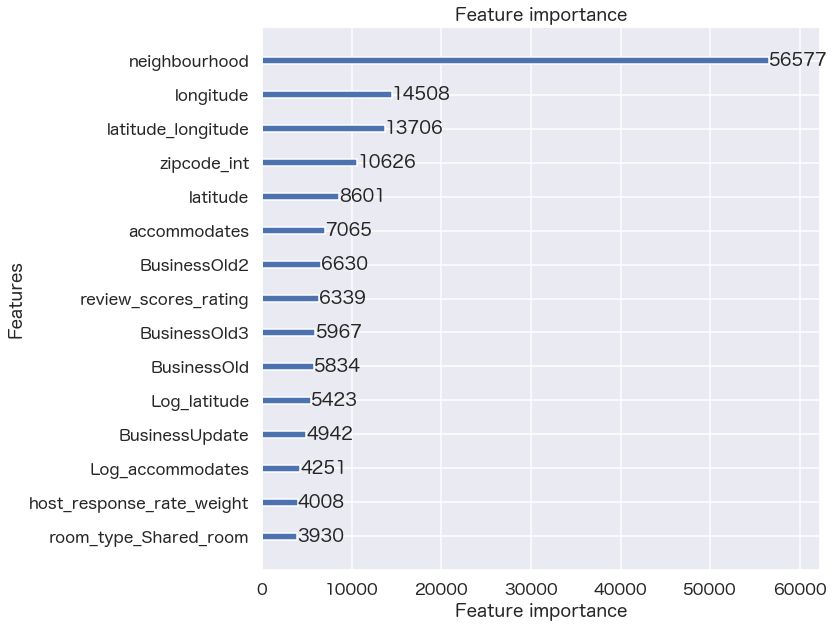

In [85]:
#特徴量の重要度を可視化
lgb.plot_importance(model, max_num_features=15, figsize=(10,10))
plt.show()

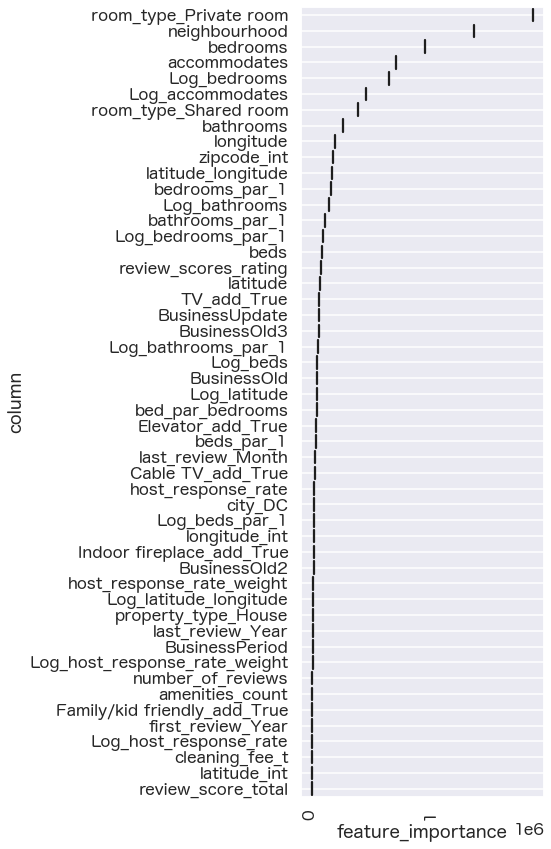

In [86]:
top_n=50
feature_importance_df = pd.DataFrame()

_df = pd.DataFrame()
_df['feature_importance'] = model.feature_importance(importance_type='gain')
_df['column'] = train_x_cv.columns
feature_importance_df = pd.concat([feature_importance_df, _df], axis=0, ignore_index=True)

order = feature_importance_df.groupby('column').sum()[['feature_importance']].sort_values('feature_importance', ascending=False).index[:top_n]

fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
sns.boxenplot(data=feature_importance_df,
              x='feature_importance',
              y='column',
              order=order,
              ax=ax,
              palette='viridis',
              orient='h')
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='x', rotation=90)
ax.grid()
fig.tight_layout()

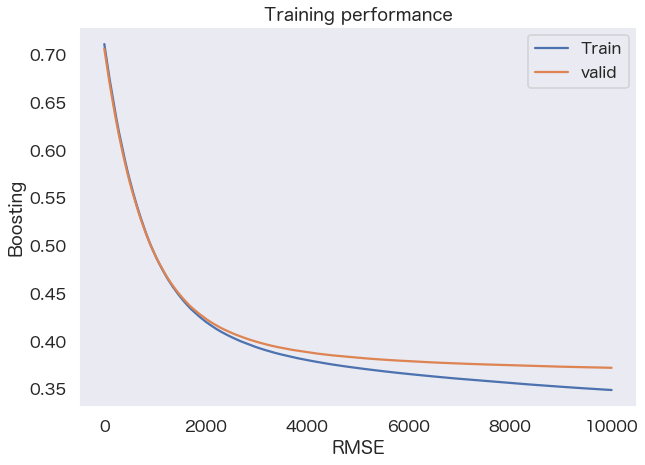

In [101]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot()
ax.plot(evaluation_results['train']['rmse'], label='Train')
ax.plot(evaluation_results['valid']['rmse'], label='valid')
ax.set_xlabel("RMSE")
ax.set_ylabel("Boosting")
ax.set_title('Training performance')
plt.grid()
plt.legend()
plt.show()

# テストデータ(submit)

In [91]:
test_X_addEDA_log_dummy.head()

,accommodates,bathrooms,bedrooms,beds,host_response_rate,latitude,longitude,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,bathrooms_par_1,bedrooms_par_1,beds_par_1,bed_par_bedrooms,latitude_int,longitude_int,latitude_longitude,review_score_total,review_score_weight,amenities_count,rare_amenities_count,description_word_count,host_response_rate_weight,first_review_Year,first_review_Month,first_review_Day,BusinessOld,host_since_Year,host_since_Month,host_since_Day,BusinessOld2,first_reviewOld,last_review_Year,last_review_Month,last_review_Day,BusinessOld3,BusinessUpdate,BusinessPeriod,zipcode_int,Log_beds_par_1,Log_bathrooms_par_1,Log_bathrooms,Log_review_score_total,Log_number_of_reviews,Log_beds,Log_accommodates,Log_bedrooms,Log_bedrooms_par_1,Log_rare_amenities_count,Log_amenities_count,Log_latitude,Log_latitude_longitude,Log_host_response_rate_weight,Log_review_score_weight,Log_description_word_count,Log_host_response_rate,bed_type_Couch,bed_type_Futon,bed_type_Pull-out Sofa,bed_type_Real Bed,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_super_strict_30,cancellation_policy_super_strict_60,city_Chicago,city_DC,city_LA,city_NYC,city_SF,cleaning_fee_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_t,property_type_Bed & Breakfast,property_type_Boat,property_type_Boutique hotel,property_type_Bungalow,property_type_Cabin,property_type_Camper/RV,property_type_Casa particular,property_type_Castle,property_type_Cave,property_type_Chalet,property_type_Condominium,property_type_Dorm,property_type_Earth House,property_type_Guest suite,property_type_Guesthouse,property_type_Hostel,property_type_House,property_type_Hut,property_type_In-law,property_type_Island,property_type_Lighthouse,property_type_Loft,property_type_Other,property_type_Parking Space,property_type_Serviced apartment,property_type_Tent,property_type_Timeshare,property_type_Tipi,property_type_Townhouse,property_type_Train,property_type_Treehouse,property_type_Vacation home,property_type_Villa,property_type_Yurt,room_type_Private room,room_type_Shared room,TV_add_True,Cable TV_add_True,Wireless Internet_add_True,Air conditioning_add_True,Kitchen_add_True,Free parking on premises_add_True,Pets allowed_add_True,Breakfast_add_True,Elevator_add_True,Hot tub_add_True,Indoor fireplace_add_True,Heating_add_True,Family/kid friendly_add_True,Suitable for events_add_True,Washer_add_True,Dryer_add_True,Smoke detector_add_True,Carbon monoxide detector_add_True,First aid kit_add_True,Safety card_add_True,Fire extinguisher_add_True,Essentials_add_True,Shampoo_add_True,Lock on bedroom door_add_True,Hangers_add_True,Hair dryer_add_True,Iron_add_True,Laptop friendly workspace_add_True,Self Check-In_add_True,Keypad_add_True,Private entrance_add_True,Baby monitor_add_True,Bathtub_add_True,Baby bath_add_True,Changing table_add_True,Children’s books and toys_add_True,Window guards_add_True,Table corner guards_add_True,Fireplace guards_add_True,Babysitter recommendations_add_True,Crib_add_True,Room-darkening shades_add_True,Game console_add_True,Hot water_add_True,Bed linens_add_True,Extra pillows and blankets_add_True,Ethernet connection_add_True,Pocket wifi_add_True,Microwave_add_True,Coffee maker_add_True,Refrigerator_add_True,Dishwasher_add_True,Dishes and silverware_add_True,Cooking basics_add_True,Oven_add_True,Stove_add_True,EV charger_add_True,Single level home_add_True,BBQ grill_add_True,Patio or balcony_add_True,Garden or backyard_add_True,Beach essentials_add_True,Luggage dropoff allowed_add_True,Long term stays allowed_add_True,Wide hallway clearance_add_True,Step-free access_add_True,Wide doorway_add_True,Flat_add_True,smooth pathway to front door_add_True,Well-lit path to entrance_add_True,Disabled parking spot_add_True,Wide clearance to bed_add_True,Accessible-height bed_add_True,Fixed grab bars for shower & toilet_add_True,Bathtub with shower chair_add_True,Roll-in s

In [92]:
#こっちは普通にKFold
sub_preds = np.zeros(test_X_addEDA_log_dummy.shape[0])
for m in models:
    sub_preds += np.exp(m.predict(test_X_addEDA_log_dummy, num_iteration=model.best_iteration))
sub_preds = sub_preds / kfolds.n_splits
# sub_preds = np.exp(sub_preds)

In [93]:
sub_preds

array([223.23266556, 138.33617482, 102.53386452, ..., 105.70821348,
       113.84712665,  43.60880587])

# Submit

In [90]:
#submit用のCSVを作成
sub = pd.DataFrame({"id":original_test_data['id'], "y":sub_preds})
print('sub["y"].isnull().sum()=', sub['y'].isnull().sum())
sub

sub["y"].isnull().sum()= 0


,id,y
0,0,223.232666
1,1,138.336175
2,2,102.533865
3,3,133.082577
4,4,117.254869
...,...,...
18523,18523,151.034593
18524,18524,99.905225
18525,18525,105.708213
18526,18526,113.847127


In [80]:
sub.to_csv('nine_submission.csv', header=False, index=False)